In [1]:
"""
Họ Và Tên: Nguyễn Quang Trường
MSSV: 21110429
DIP Lab02
"""

'\nHọ Và Tên: Nguyễn Quang Trường\nMSSV: 21110429\nDIP Lab02\n'

# Lab02-Image Processing and Analysis

In [2]:
import numpy as np 
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 
from pylab import imread
from skimage.color import rgb2gray

In [3]:
def imshows(ImageData, LabelData, rows, cols, gridType = False):
  # Convert ImageData and LabelData to List
  from matplotlib import pyplot as plt
  ImageArray = list(ImageData)
  LabelArray = list(LabelData)
  if(rows == 1 & cols == 1):
    fig = plt.figure(figsize=(20,20))
  else:
    fig = plt.figure(figsize=(cols*8,rows*5))
        
  for i in range(1, cols * rows + 1):
      fig.add_subplot(rows, cols, i)
      image = ImageArray[i - 1]
      # If the channel number is less than 3, we display as grayscale image
      # otherwise, we display as color image
      if (len(image.shape) < 3):
          plt.imshow(image, plt.cm.gray)
          plt.grid(gridType)
      else:
          plt.imshow(image)
          plt.grid(gridType)
      plt.title(LabelArray[i - 1])
  plt.show()

def ShowThreeImages(IM1, IM2, IM3):
    imshows([IM1, IM2, IM3], ["Image 1","Image 2", "Image 3"], 1, 3)
def ShowTwoImages(IM1, IM2):
    imshows([IM1, IM2], ["Image 1","Image 2"], 1, 2)
def ShowOneImage(IM):
    imshows([IM], ["Image"], 1, 1)
def ShowListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
    imshows(listImage,listCaption,row,col)

## Câu 1:

### Viết thành một function cho biết thông tin của bức ảnh : Ảnh màu hay ảnh xám và giá trị min max tương ứng với cừng kênh màu

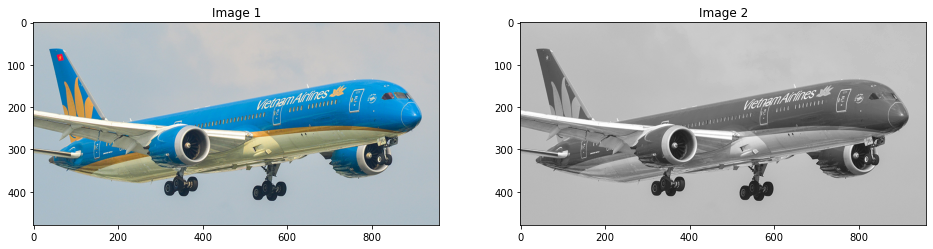

In [4]:
# Read Image 
image_color = imread("VNAirline.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowTwoImages(image_color, image_gray)

Function thông tin về ảnh

In [5]:
def inforImage(image_color):
    # Show Information of Color Image
    Image = image_color.copy()
    Width = Image.shape[1]
    Height = Image.shape[0]
    Channel = len(Image.shape)
    

    IM = image_color.copy
    if(Channel == 2):
        print("___________________________Image Gray______________________________")
        print("Min Intensity: ", Image.min(), " Max Intensity: ", Image.max())
    else:
        print("___________________________Image Color______________________________")
        print("Red - Min Intensity: ", Image[:,:,0].min(), " ,Max Intensity: ", Image[:,:,0].max())
        print("Green - Min Intensity: ", Image[:,:,1].min(), " ,Max Intensity: ", Image[:,:,1].max())
        print("Blue - Min Intensity: ", Image[:,:,2].min(), " ,Max Intensity: ", Image[:,:,2].max())    
    print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)
    print("_____________________________________________________________________")
    

In [6]:
inforImage(image_color)

___________________________Image Color______________________________
Red - Min Intensity:  0  ,Max Intensity:  255
Green - Min Intensity:  0  ,Max Intensity:  255
Blue - Min Intensity:  0  ,Max Intensity:  255
Width :  960  Height :  479  Channel :  3
_____________________________________________________________________


In [7]:
inforImage(image_gray)

___________________________Image Gray______________________________
Min Intensity:  1  Max Intensity:  255
Width :  960  Height :  479  Channel :  2
_____________________________________________________________________


### Hiển thị 24 bức ảnh theo bit của từng kênh màu R, G, B (mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit) 

In [8]:
def intToBitArray(img) :
    row ,col = img.shape
    list = []
    for i in range(row):
        for j in range(col):
             list.append (np.binary_repr( img[i][j] ,width=8  ) )
    return list #the binary_repr() fucntion returns binary values but in 
                #string 
                #, not integer, which has it's own perk as you will notice 
def bitplane(bitImgVal , img1D ):
    bitList = [  int(   i[bitImgVal]  )    for i in img1D]
    return bitList
def GetBitImage(index, image2D):
    ImageIn1D = intToBitArray(image2D)
    Imagebit = np.array( bitplane(index, ImageIn1D ) )
    Imagebit = np.reshape(Imagebit , image2D.shape )
    return Imagebit
def GetAllBitImage(image2D):
    image2D_Bit = list()
    for i in range(8):
        image2D_Bit.append(GetBitImage(i, image2D))
    return image2D_Bit

Hiển thị 8 bức ảnh theo bit của từng kênh màu R

List have  8  images


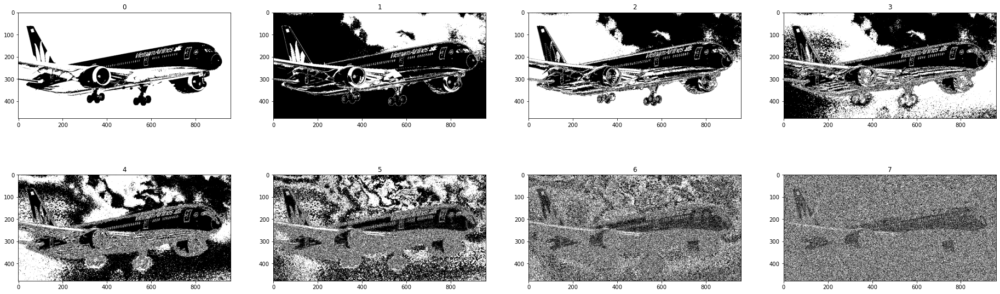

In [9]:
# Get 8 Mask Image corresponding to 8 bit of grayscale image
# R
image2D_Bit = GetAllBitImage(image_color[:,:,0])
print("List have ", len(image2D_Bit), " images")
ShowListImages(image2D_Bit, 2, 4)

______________________________________________

Hiển thị 8 bức ảnh theo bit của từng kênh màu G

List have  8  images


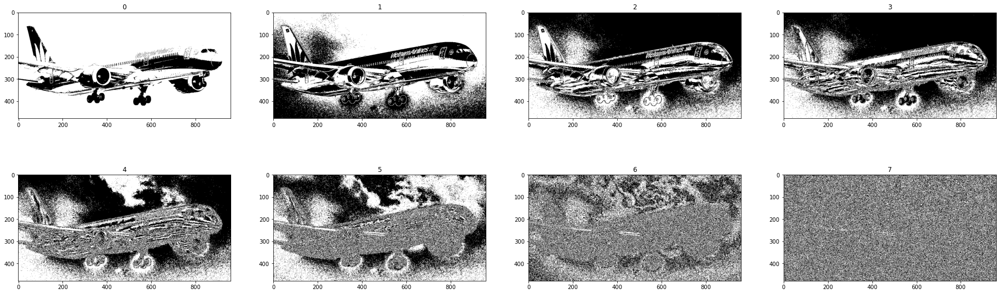

In [10]:
# G
image2D_Bit = GetAllBitImage(image_color[:,:,1])
print("List have ", len(image2D_Bit), " images")
ShowListImages(image2D_Bit, 2, 4)

__________________________________________________

Hiển thị 8 bức ảnh theo bit của từng kênh màu B

List have  8  images


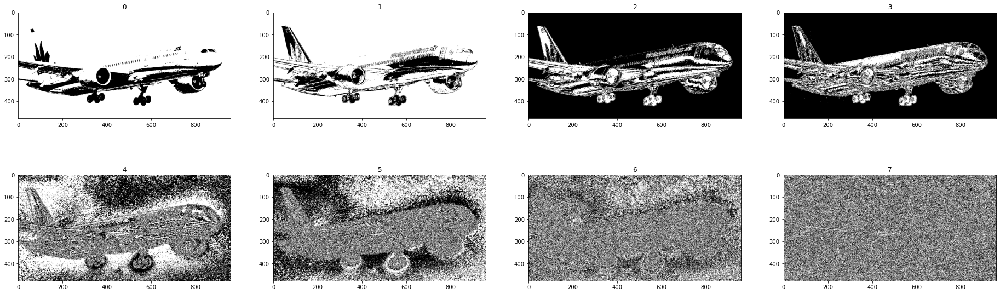

In [11]:
# B
image2D_Bit = GetAllBitImage(image_color[:,:,2])
print("List have ", len(image2D_Bit), " images")
ShowListImages(image2D_Bit, 2, 4)

### Hiển thị 24 bức ảnh theo bit của từng kênh màu H, S, V (mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit) 

In [12]:
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_RGB2HSV)

Hiển thị 8 bức ảnh theo bit của từng kênh màu H

List have  8  images


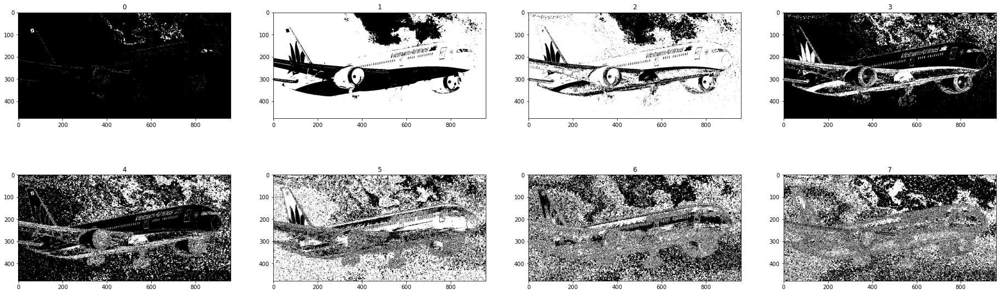

In [13]:
# H
image2D_Bit = GetAllBitImage(image_hsv[:,:,0])
print("List have ", len(image2D_Bit), " images")
ShowListImages(image2D_Bit, 2, 4)

________________________________________________________

Hiển thị 8 bức ảnh theo bit của từng kênh màu S

List have  8  images


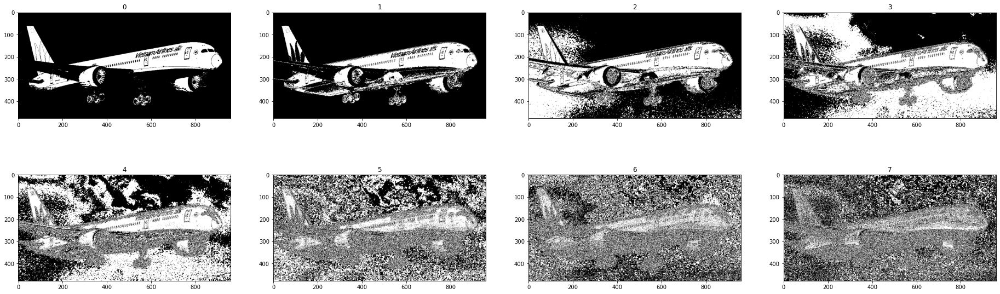

In [14]:
# S
image2D_Bit = GetAllBitImage(image_hsv[:,:,1])
print("List have ", len(image2D_Bit), " images")
ShowListImages(image2D_Bit, 2, 4)

__________________________________________________________

Hiển thị 8 bức ảnh theo bit của từng kênh màu V

List have  8  images


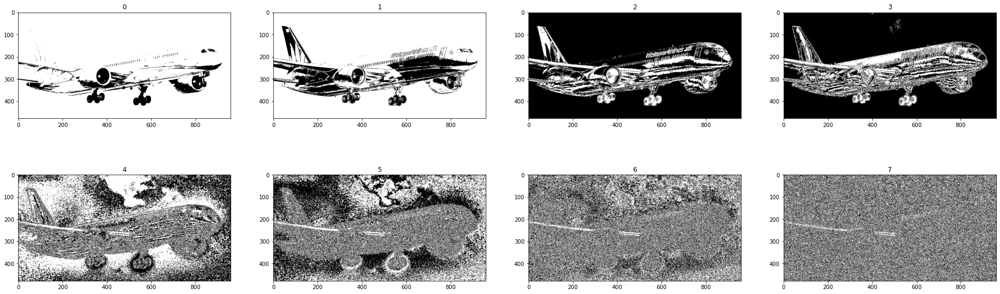

In [15]:
# V
image2D_Bit = GetAllBitImage(image_hsv[:,:,2])
print("List have ", len(image2D_Bit), " images")
ShowListImages(image2D_Bit, 2, 4)

### Cho biết trong 24 ảnh bit theo kênh R, G, B có ảnh nào có thể dùng để trích xuất đối tượng hay không. Nếu có thì hiển thị ảnh bit đó ra

Trong 24 ảnh bit kênh R,G,B : Có ảnh có thể xuất đối tượng. Ảnh ở kênh R

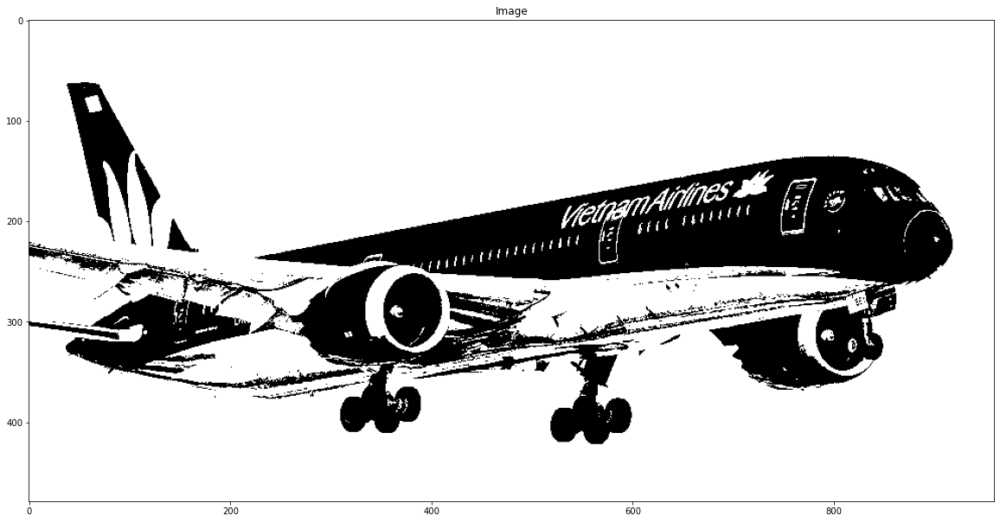

In [16]:
ShowOneImage(GetBitImage(0, image_color[:,:,0]))

###  Cho biết trong 24 ảnh bit theo kênh H, S, V có ảnh nào có thể dùng để trích xuất đối tượng hay không. Nếu có thì hiển thị ảnh bit đó ra

Trong 24 ảnh bit theo kênh H,S,V có ảnh có thể dùng để trích xuất đối tượng. Ở kênh S

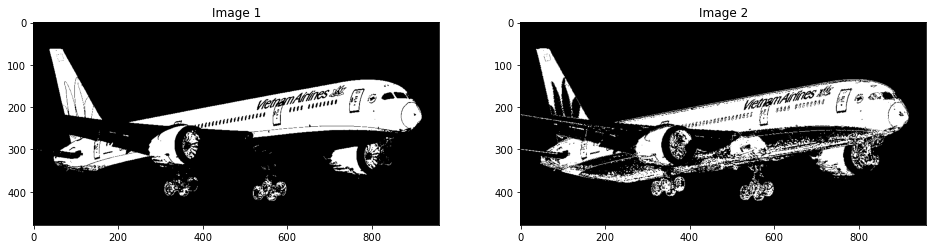

In [17]:
ShowTwoImages(GetBitImage(0, image_hsv[:,:,1]),GetBitImage(1, image_hsv[:,:,1]))

## Bài 2: Bức ảnh có nhiều mặt người  và thực hiện các thao tác 

Image Size: (650, 650, 3)


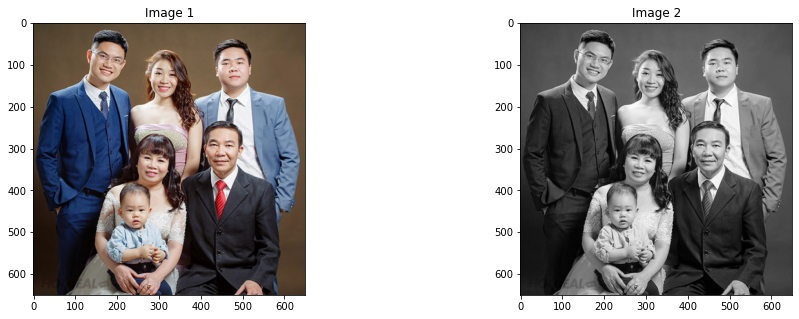

In [18]:
# Read Image 
image_color = imread("face2.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
print("Image Size:", image_color.shape)
ShowTwoImages(image_color, image_gray)

Một số phương pháp trích xuất cạnh 

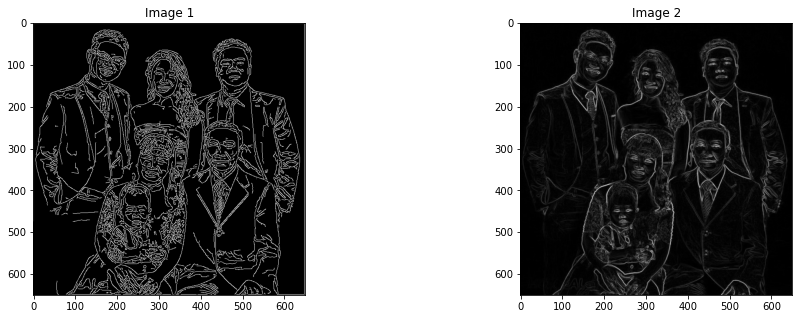

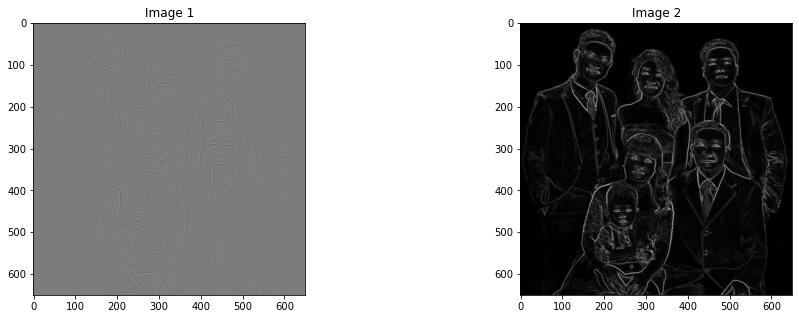

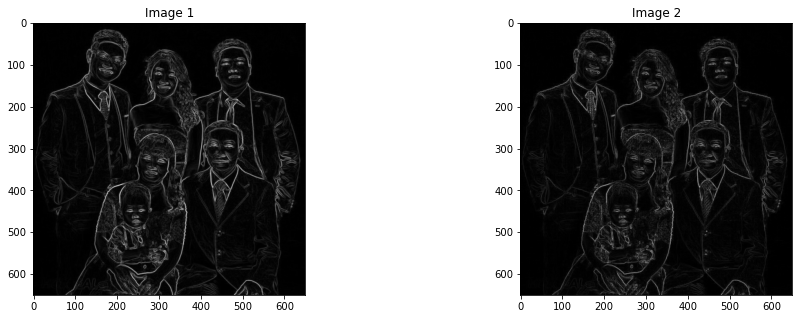

In [19]:
import cv2
from skimage import feature, filters

edges_canny = feature.canny(image_gray) # Canny
edges_sobel = filters.sobel(image_gray) # Sobel
edges_laplace = filters.laplace(image_gray) # Laplacian
edges_scharr = filters.scharr(image_gray) # Scharr
edges_prewitt = filters.prewitt(image_gray) # Prewitt
edges_roberts = filters.roberts(image_gray) # Roberts

ShowTwoImages(edges_canny, edges_sobel)
ShowTwoImages(edges_laplace, edges_scharr)
ShowTwoImages(edges_prewitt, edges_roberts)

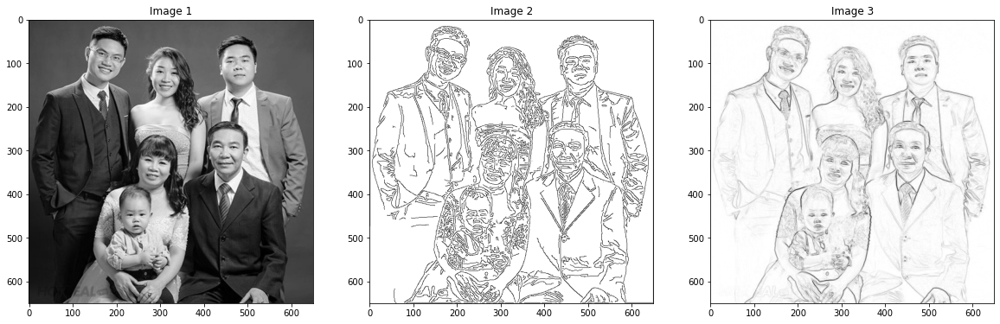

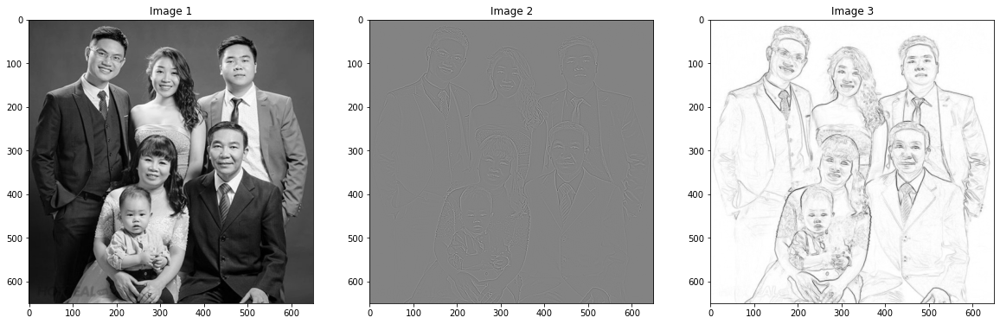

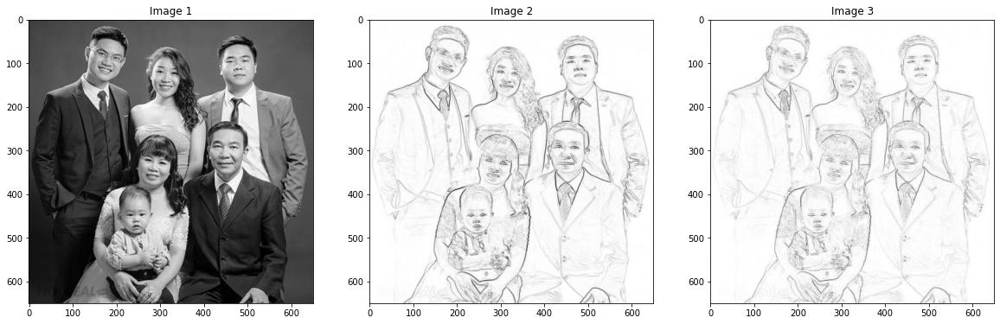

In [20]:
# Invert 
ShowThreeImages(image_gray, 1 - edges_canny, 1 - edges_sobel)
ShowThreeImages(image_gray, 1 - edges_laplace, 1 - edges_scharr)
ShowThreeImages(image_gray, 1 - edges_prewitt, 1 - edges_roberts)

In [21]:
# Edge Detection on Color Image
from skimage.color.adapt_rgb import adapt_rgb, each_channel, hsv_value
from skimage import filters

@adapt_rgb(each_channel)
def sobel_each(image):
    return filters.sobel(image)

@adapt_rgb(each_channel)
def robert_each(image):
    return filters.roberts(image)

@adapt_rgb(hsv_value)
def sobel_hsv(image):
    return filters.sobel(image)

@adapt_rgb(hsv_value)
def robert_hsv(image):
    return filters.roberts(image)

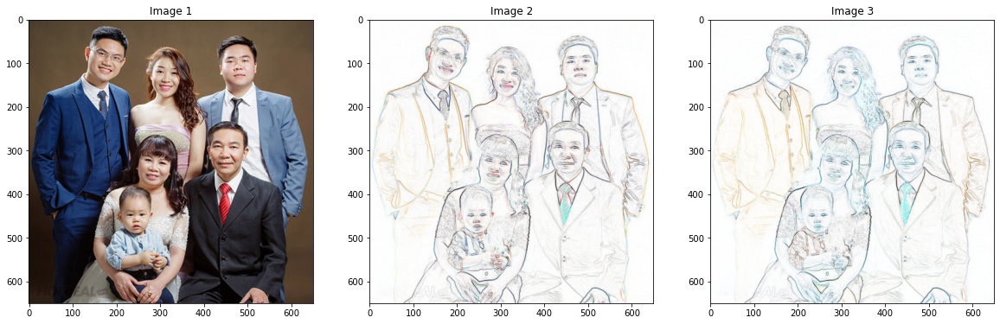

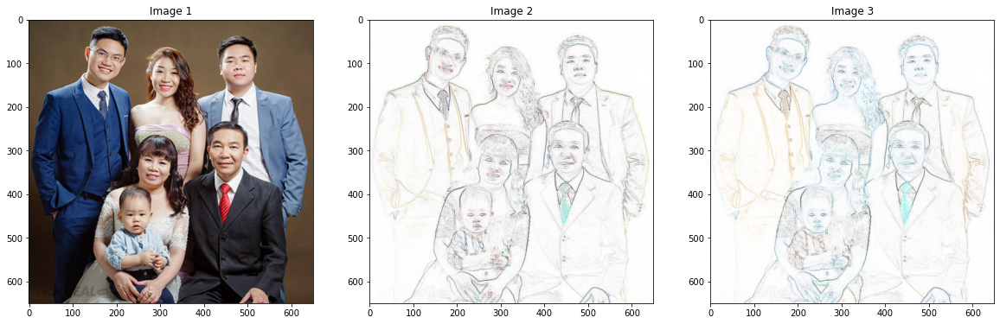

In [22]:
from skimage.exposure import rescale_intensity

image_sobel_rgb = rescale_intensity(1 - sobel_each(image_color))
image_sobel_hsv = rescale_intensity(1 - sobel_hsv(image_color))

image_robert_rgb = rescale_intensity(1 - robert_each(image_color))
image_robert_hsv = rescale_intensity(1 - robert_hsv(image_color))

ShowThreeImages(image_color, image_sobel_rgb, image_sobel_hsv)
ShowThreeImages(image_color, image_robert_rgb,image_robert_hsv)

### function input ảnh màu và xuất ảnh chân dung xám và chân dùng màu của ảnh 

In [23]:
def convert(image_color):
    
    
    image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
    edges_sobel = filters.sobel(image_gray) # Sobel
    image_sobel_rgb = rescale_intensity(1 - sobel_each(image_color))
    
    ShowThreeImages(image_color,1-edges_sobel,image_robert_rgb)

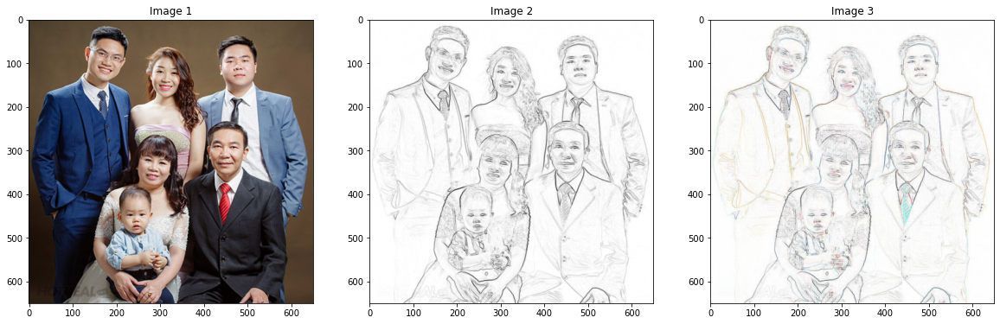

In [24]:
convert(image_color)

### Range màu lower và upper để trích xuất được các khuôn mặt trong ảnh màu

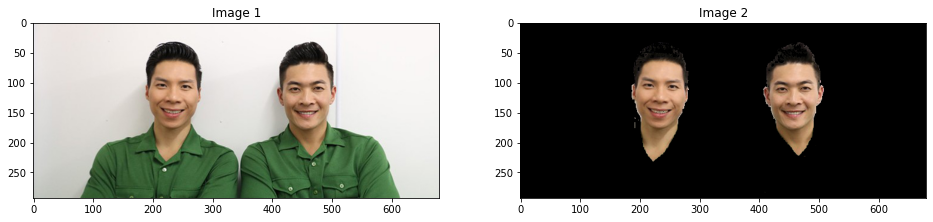

In [25]:
img=imread("face8.jpg")

hsv_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

lower = np.array([90, 30, 0], dtype=np.uint8)
upper = np.array([170, 255, 255], dtype=np.uint8)

mask = cv2.inRange(hsv_image, lower, upper)
result = cv2.bitwise_and(img, img, mask=mask)
ShowTwoImages(img,result)



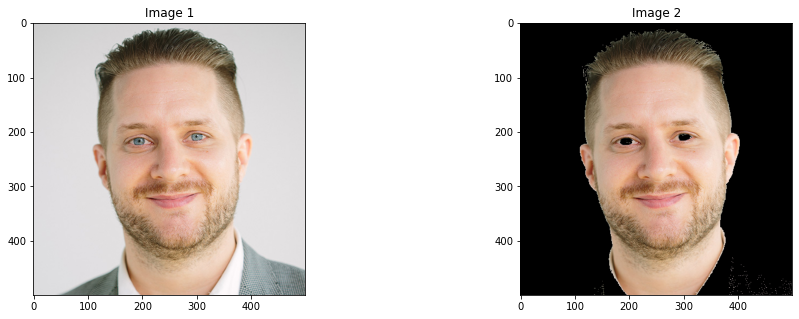

In [26]:
img=imread("face.jpg")

hsv_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Định rõ giá trị lower và upper cho kênh màu HSV
lower = np.array([80, 20, 0], dtype=np.uint8)
upper = np.array([160, 255, 255], dtype=np.uint8)

# Tạo mặt nạ (mask) dựa trên giá trị lower và upper
mask = cv2.inRange(hsv_image, lower, upper)

# Áp dụng mặt nạ vào hình ảnh gốc để tách khuôn mặt người
result = cv2.bitwise_and(img, img, mask=mask)
ShowTwoImages(img,result)



### Nhận Diện Khuôn Mặt Và Đếm Có Bao Nhiêu Khuôn Mặt Bằng CascadeClassifier dựa trên bộ phân loại haarcascade_frontalface_default.xml

So khuon mat: 6


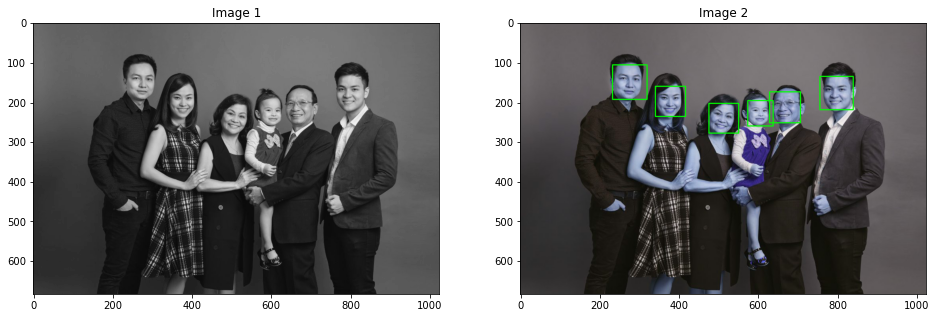

In [27]:
# Tải bộ phân loại khuôn mặt
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')


image = cv2.imread('face4.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5, minSize=(30, 30))
for (x, y, w, h) in faces:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    
print("So khuon mat: {}".format(len(faces)))

ShowTwoImages(gray,image)


## Bài 3: bức ảnh  về 1 đồ vật và thực hiện các thao tác

Image Size: (466, 699, 3)


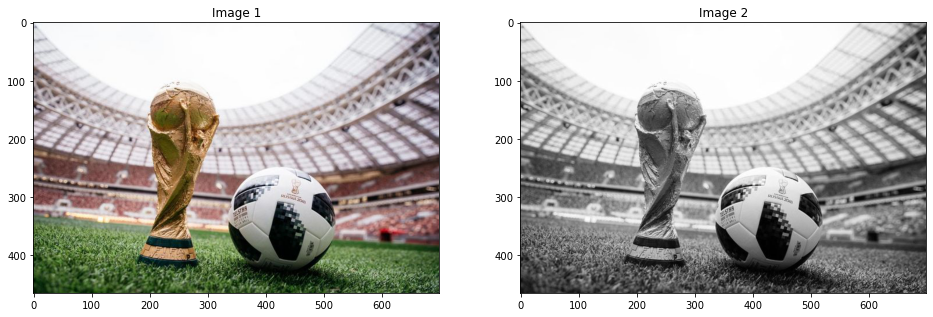

In [28]:
# Read Image 
image_color = imread("Cup_bong.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
print("Image Size:", image_color.shape)
ShowTwoImages(image_color, image_gray)

### Xuất ảnh xoay các góc 30,45,60 độ

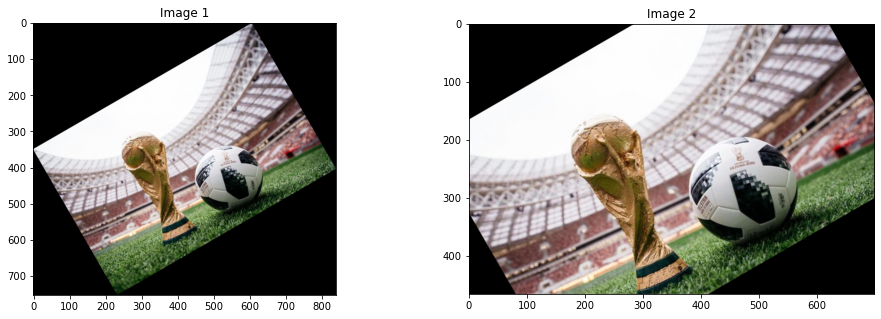

In [29]:
from skimage.transform import rotate
image_color_rotate_30_01 = rotate(image_color, 30, resize=True)
image_color_rotate_30_02 = rotate(image_color, 30)
ShowTwoImages(image_color_rotate_30_01, image_color_rotate_30_02)


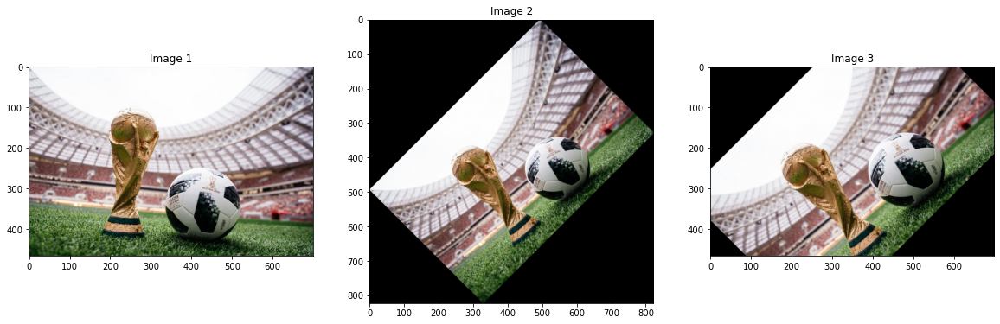

In [30]:
image_color_rotate_45 = rotate(image_color, 45, resize=True)
image_color_rotate_45_02 = rotate(image_color, 45)
ShowThreeImages(image_color, image_color_rotate_45,image_color_rotate_45_02)

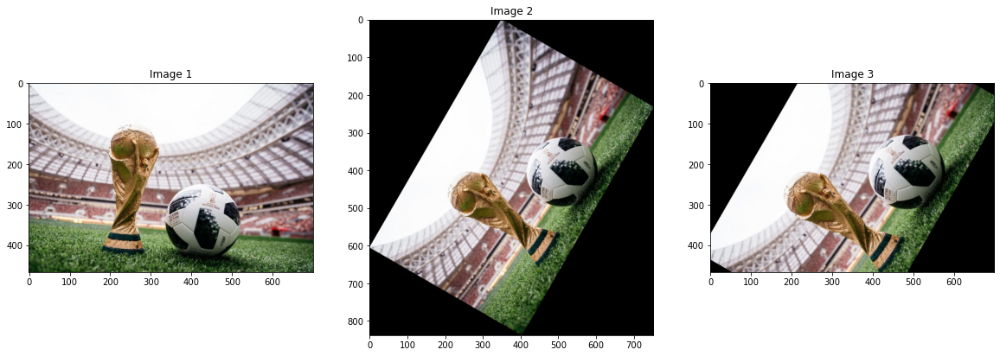

In [31]:
image_color_rotate_60 = rotate(image_color, 60, resize=True)
image_color_rotate_60_02 = rotate(image_color, 60)
ShowThreeImages(image_color, image_color_rotate_60,image_color_rotate_60_02)

### Xuất ảnh đối xứng qua trục hoành và trục tung đi qua tâm ảnh

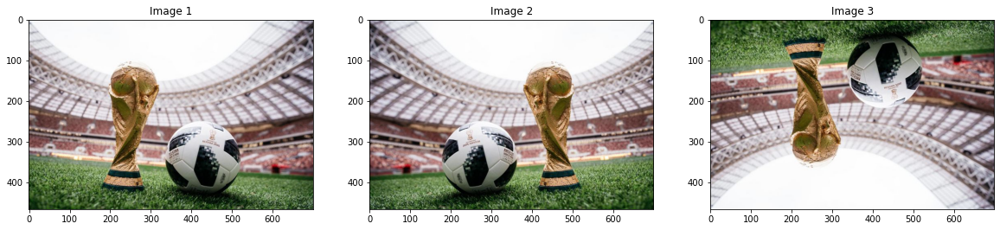

In [32]:
image_color_horizontal_flip = image_color[:, ::-1]
image_color_vertical_flip = image_color[::-1, :]
ShowThreeImages(image_color, image_color_horizontal_flip,image_color_vertical_flip)

### Xuất ảnh inversion

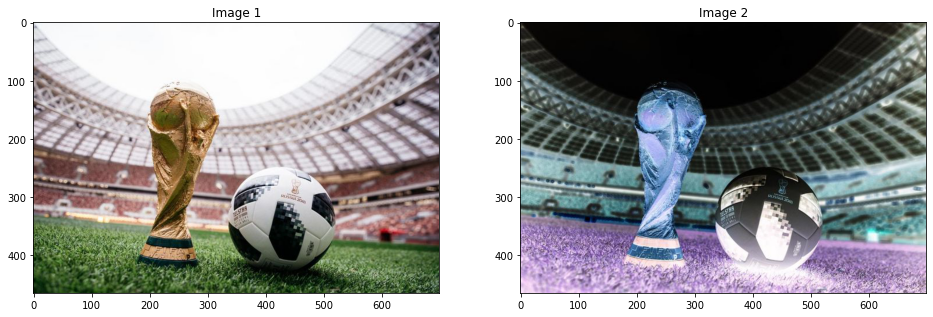

In [33]:
from skimage import util
image_color_inversion = util.invert(image_color)
ShowTwoImages(image_color, image_color_inversion)

### Xuất ảnh enhance contrast

24.0 253.0


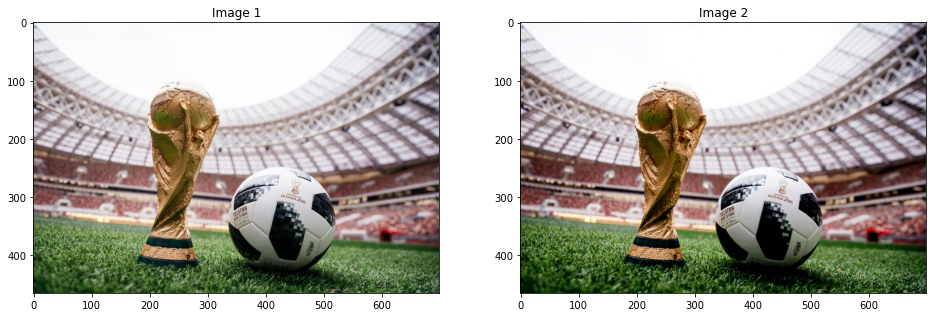

In [34]:
import numpy as np
from skimage import exposure

# take from 10 to 90 percent of color range
v_min, v_max = np.percentile(image_color, (5, 95))
better_contrast = exposure.rescale_intensity(image_color, in_range=(v_min, v_max))

print(v_min, v_max)
ShowTwoImages(image_color, better_contrast)

### Xuất ảnh gamma và log enhancement 

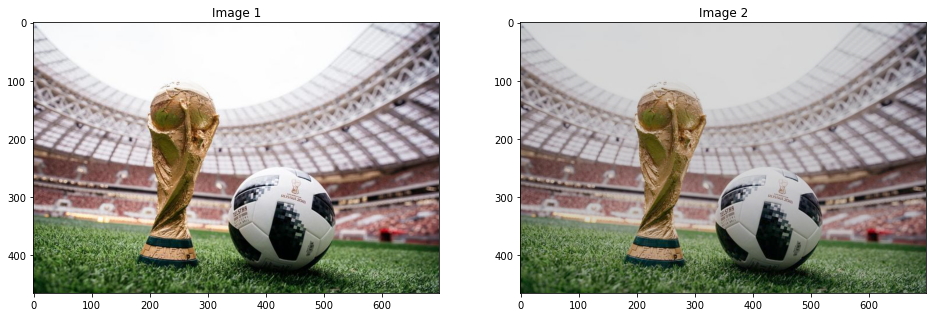

In [35]:
# gamma and gain parameters are between 0 and 1
adjusted_gamma_image = exposure.adjust_gamma(image_color, gamma=0.8, gain=0.85)
ShowTwoImages(image_color, adjusted_gamma_image)

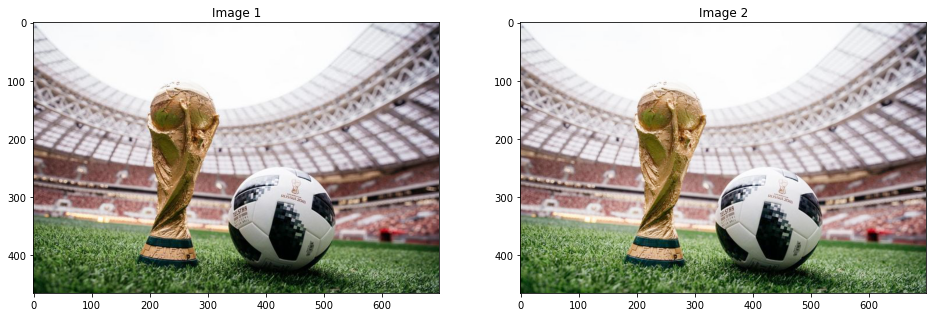

In [36]:
# Logarithmic corrected
log_correction_image = exposure.adjust_log(image_color)

ShowTwoImages(image_color, log_correction_image)

### Tịnh Tiến Bức Ảnh

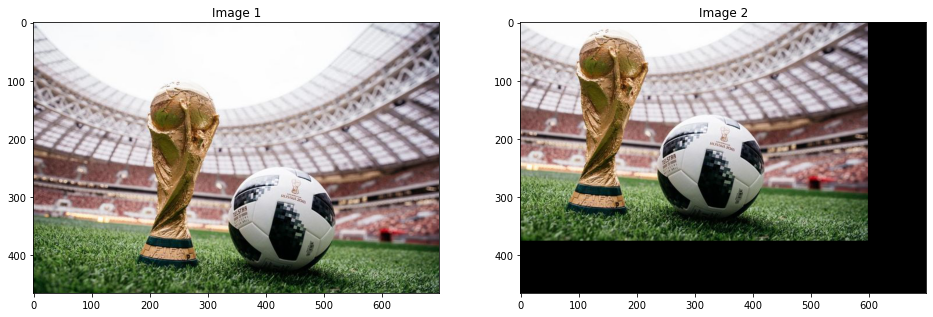

In [37]:

dx, dy = -100, -90  
M = np.float32([[1, 0, dx], [0, 1, dy]])
translated_image = cv2.warpAffine(image_color, M, (image_color.shape[1], image_color.shape[0]))

ShowTwoImages(image_color,translated_image)

### Reside Ảnh

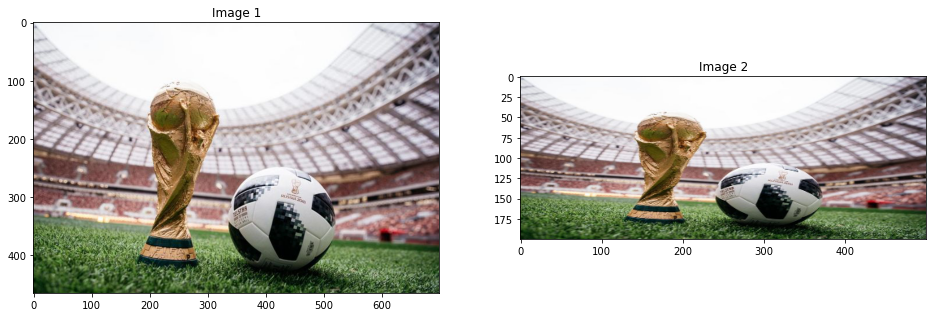

In [38]:

width = 500
height = 200

zoomed_out = cv2.resize(image_color, (width, height))
zoomed_in = cv2.resize(image_color, (width, height))

ShowTwoImages(image_color,zoomed_in)